> 실습목표
> - Augmentation을 하는 이유를 알아갑니다.
> - 여러 가지 Augmentation 방법을 알아둡니다.
> - 학습에 Augmentation을 적용할때 주의해야 할 점을 숙지합니다.

Data augmentation은 갖고 있는 데이터셋을 여러 가지 방법으로 증강시켜(augment) 실질적인 학습 데이터셋의 규모를 키울 수 있는 방법이다. 일반적으로 하드디스크에 저장된 이미지 데이터를 메모리에 로드한 후, 학습시킬 때 변형을 가하는 방법을 사용하여 1장의 이미지를 더 다양하게 쓸 수 있게 된다.

데이터가 많아진다는 것은 과적합(overfitting)을 줄일 수 있다는 것을 의미한다. 또한 우리가 가지고 있는 데이터셋이 실제 상황에서의 입력값과 다를 경우, augmentation을 통해서 실제 입력값과 비슷한 데이터 분포를 만들어 낼 수 있다. 예를 들어, 우리가 학습한 데이터는 노이즈가 많이 없는 사진이지만 테스트 이미지는 다양한 노이즈가 있는 경우 테스트에서 좋은 성능을 내기 위해서는 이러한 노이즈의 분포를 예측하고 학습 데이터에 노이즈를 삽입해 모델이 이런 노이즈에 잘 대응할 수 있도록 해야 한다. 이렇게 data augmentation은 데이터를 늘릴 뿐만 아니라 모델이 실제 테스트 환경에서 잘 동작할 수 있도록 도와주기도 한다.

**tensorflow 기본 augmentation list**

https://www.tensorflow.org/tutorials/images/data_augmentation
    
- Flipping
- Gray scale
- Saturation
- Brightness
- Rotation
- Center Crop
- Gaussian noise
- Contrast change
- Sharpen
- Affine transformation
- Padding
- Blurring

### 3-5. 텐서플로우를 사용한 Image Augmentation (1) Flip

이미지를 PIL로 로드하고 이를 텐서로 바꾼 뒤, 기법을 하나씩 적용해보고 이를 다시 이미지로 화면에 표시해서 결과를 확인

In [5]:
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import os

sample_img_path = os.getenv('HOME')+'/aiffel/GoingDeeper/data_augmentation/images/mycat.jpg'
sample_img_path

'/aiffel/aiffel/GoingDeeper/data_augmentation/images/mycat.jpg'

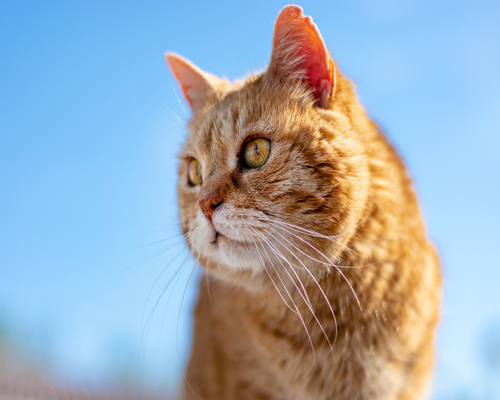

In [6]:
image = Image.open(sample_img_path).resize((500, 400)) # 이미지에 따라 숫자를 바꾸어 보세요.
image_tensor = tf.keras.preprocessing.image.img_to_array(image) # image를 tensor로 변환

image

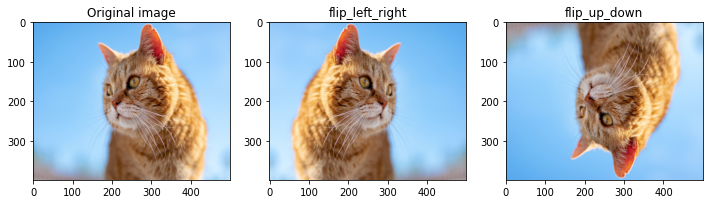

In [7]:
# Flip을 적용해줍시다. Flip은 flip_left_right와 flip_up_down 두 가지로 좌우와 상하 반전으로 구분됩니다.

flip_lr_tensor = tf.image.flip_left_right(image_tensor) # image_tensor을 flip_lr_tensor로 변환
flip_ud_tensor = tf.image.flip_up_down(image_tensor)
flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor) #flip_lr_tensor을 flip_lr_image로 재변환
flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)

plt.figure(figsize=(12, 12))

plt.subplot(1,3,1)
plt.title('Original image')
plt.imshow(image)

plt.subplot(1,3,2)
plt.title('flip_left_right')
plt.imshow(flip_lr_image)

plt.subplot(1,3,3)
plt.title('flip_up_down')
plt.imshow(flip_ud_image)

plt.show()

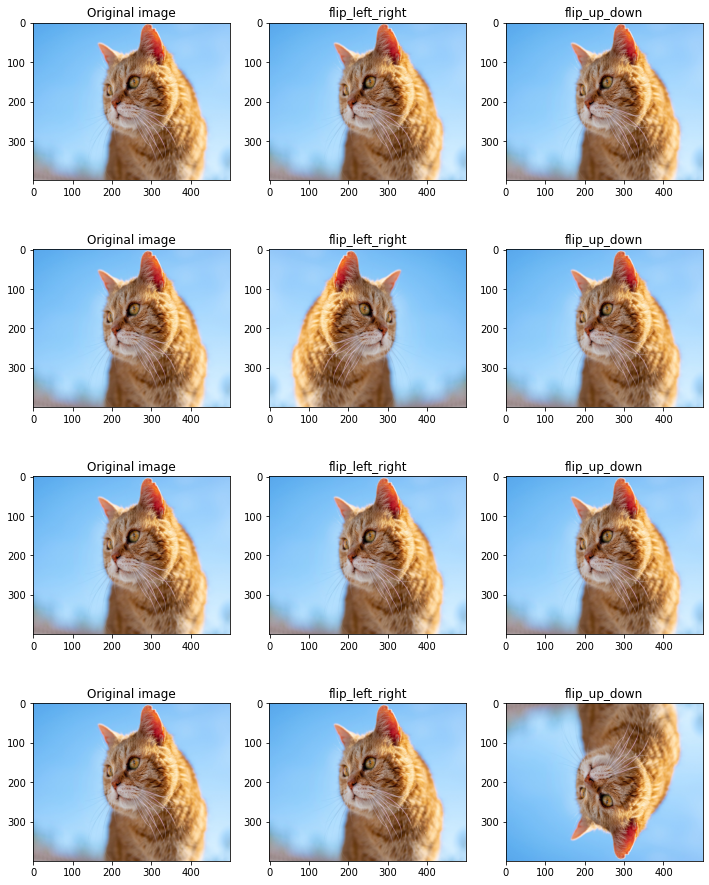

In [8]:
plt.figure(figsize=(12, 16))

row = 4
for i in range(row):
    flip_lr_tensor = tf.image.random_flip_left_right(image_tensor)   # random augmentation
    flip_ud_tensor = tf.image.random_flip_up_down(image_tensor)
    flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
    flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)
    
    plt.subplot(4,3,i*3+1)
    plt.title('Original image')
    plt.imshow(image)

    plt.subplot(4,3,i*3+2)
    plt.title('flip_left_right')
    plt.imshow(flip_lr_image)

    plt.subplot(4,3,i*3+3)
    plt.title('flip_up_down')
    plt.imshow(flip_ud_image)

### 3-6. 텐서플로우를 사용한 Image Augmentation (2) Center Crop

중앙을 기준으로 자른 이미지를 사용하는 augmentation 기법. 단순하게 중심점을 기준으로 사진을 확대하는 것으로 생각하기 쉽지만, 적용할 때 주의해 사용해야 한다. central_fraction은 얼마나 확대를 할지를 조절하는 매개변수. 1.0인 경우는 원본 이미지와 같다. 그러나 예를 들어 고양이 이미지를 확대하면 0.5까지는 보일 수 있지만 0.25 수준으로 내려가면 털만 보이고 고양이의 형상을 찾기 어려울 수 있다. 따라서 central_fraction의 범위를 문제가 생기지 않는 범위에서 랜덤하게 조절되도록 해야한다.

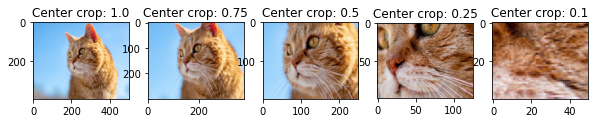

In [9]:
# 랜덤하게 centeral_crop을 적용하는 함수는 텐서플로우에서 기본적으로 제공되지 않는다
# 파이썬의 random 모듈을 사용하거나 텐서플로우의 랜덤 모듈을 사용

plt.figure(figsize=(12, 15))

central_fractions = [1.0, 0.75, 0.5, 0.25, 0.1]
col = len(central_fractions)
for i, frac in enumerate(central_fractions):
    cropped_tensor = tf.image.central_crop(image_tensor, frac)
    cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)
    
    plt.subplot(1,col+1,i+1)
    plt.title(f'Center crop: {frac}')
    plt.imshow(cropped_img)

In [10]:
# tf.random.uniform을 사용해서 central_fraction 매개변수에 전달할 값을 만들고 
# 이를 사용해 cropped_tensor를 만들어내는 random_central_crop() 함수

def random_central_crop(image_tensor, range=(0, 1)):
    central_fraction = tf.random.uniform([1], minval=range[0], maxval=range[1], dtype=tf.float32)
    cropped_tensor = tf.image.central_crop(image_tensor, central_fraction)
    return cropped_tensor
print('=3')

=3


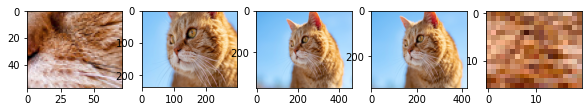

In [11]:
plt.figure(figsize=(12, 15))

col = 5
for i, frac in enumerate(central_fractions):
    cropped_tensor =random_central_crop(image_tensor)
    cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)
    
    plt.subplot(1,col+1,i+1)
    plt.imshow(cropped_img)

**tf.random.uniform()과 tf.random.normal()의 차이**
랜덤값을 uniform distribution으로 뽑는 것과 normal distribution으로 뽑는 차이.
normal distribution의 경우 mean, std를 통해서 분포를 조절가능

### 3-7. 텐서플로우를 사용한 Image Augmentation (3) 직접 해보기

1. tf.image.random_crop(): https://www.tensorflow.org/api_docs/python/tf/image/random_crop
2. tf.image.random_brightness(): https://www.tensorflow.org/api_docs/python/tf/image/random_brightness

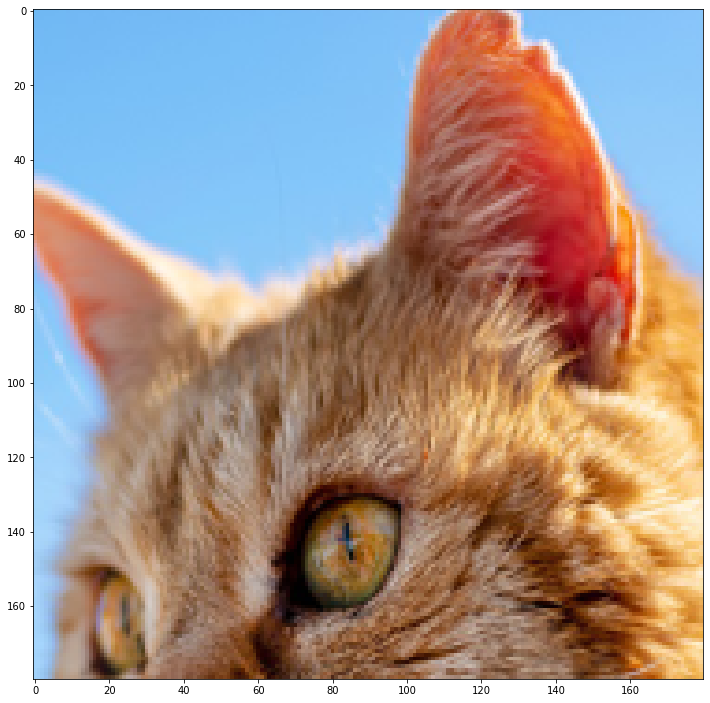

In [12]:
# apply random_crop on cat image

plt.figure(figsize=(12, 15))

random_crop_tensor = tf.image.random_crop(image_tensor,[180,180,3])
random_crop_image = tf.keras.preprocessing.image.array_to_img(random_crop_tensor)

plt.imshow(random_crop_image)
plt.show()

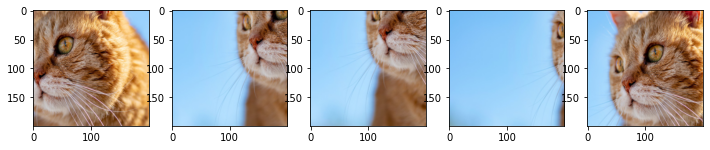

In [13]:
# display 5 random cropped images

plt.figure(figsize=(12, 15))

for i in range(5):
  random_crop_tensor = tf.image.random_crop(image_tensor,[200,200,3])
  random_crop_image = tf.keras.preprocessing.image.array_to_img(random_crop_tensor)
  plt.subplot(1,5,i+1)
  plt.imshow(random_crop_image)

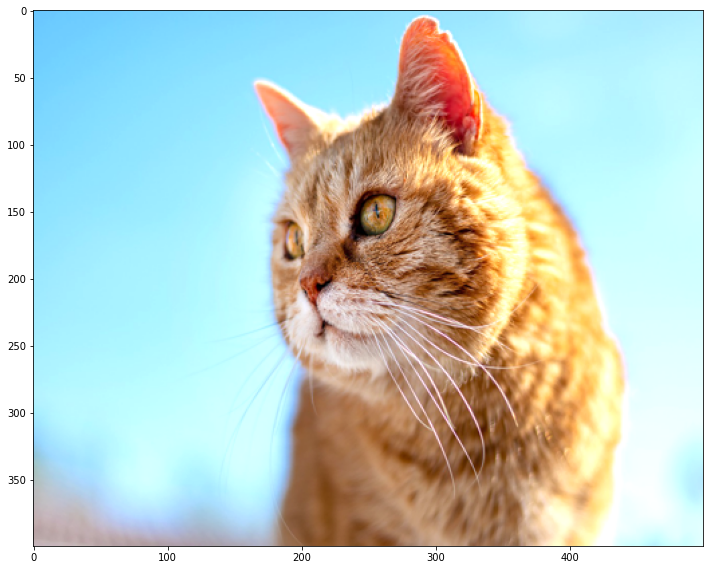

In [14]:
# tf.image.random_brightness()

# apply random_brightness on cat image
plt.figure(figsize=(12, 15))

random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128)
random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

plt.imshow(random_bright_image)
plt.show()

tf.image.random_brightness()만 적용할 경우 이미지 텐서 값의 범위가 0~255를 초과하게 될 수도 있다. 이 경우 plt.imshow()에서 rescale되어 밝기 변경 효과가 상쇄되어 보일 수도 있다. 따라서 tf.image.random_brightness() 다음에는 tf.clip_by_value()를 적용해 주는 것을 잊지 말 것.

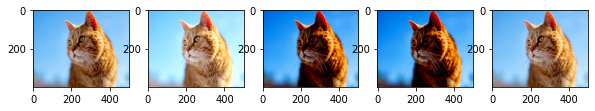

In [15]:
plt.figure(figsize=(12, 15))

col = 5
for i in range(5):
    random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128)
    random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
    random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

    plt.subplot(1,col+1,i+1)
    plt.imshow(random_bright_image)

### 3-8. albumentations 라이브러리

Albummentations은 이미지 증강을 위한 Python 라이브러리. 이미지 증강은 딥 러닝 및 컴퓨터 비전 작업에서 훈련된 모델의 품질을 높이는 데 사용된다.
augmentation에서는 배열을 이미지의 기본 형태로 사용하기 때문에 PIL Image 데이터형을 넘파이(numpy) 배열로 변환하여 사용.

In [16]:
import numpy as np
image = Image.open(sample_img_path).resize((400, 300)) # 이미지에 따라 숫자를 바꾸어 보세요.
image_arr = np.array(image)
image_arr.shape

(300, 400, 3)

In [17]:
def visualize(image):
    plt.figure(figsize=(20, 10))
    plt.imshow(image)

print("슝")

슝


1. transforms.Affine()

transforms.Affine()의 Affine()은 아핀 변환(Affine transform)을 이미지에 적용한 것. 2D 변환의 일종인 아핀 변환은 이미지의 스케일(scale)을 조절하거나 평행이동, 또는 회전 등의 변환
https://albumentations.ai/docs/api_reference/augmentations/geometric/transforms/#albumentations.augmentations.geometric.transforms.Affine

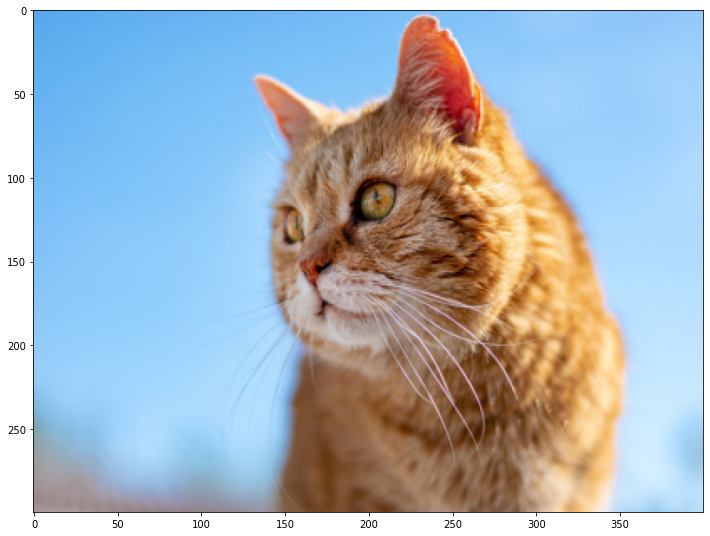

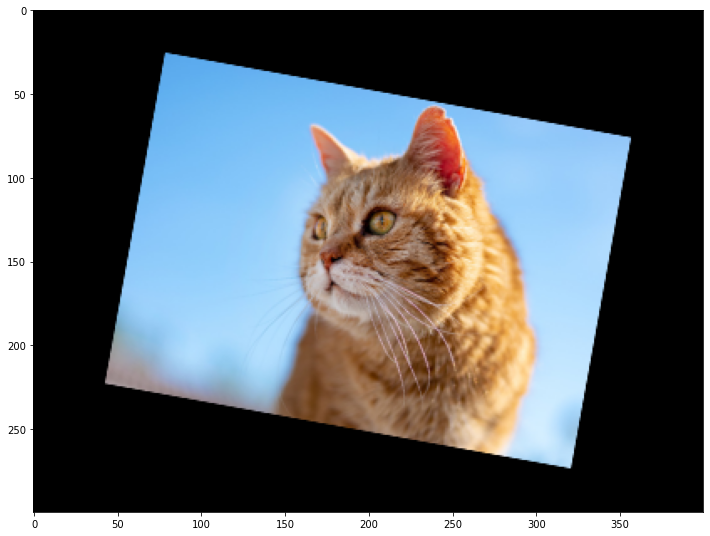

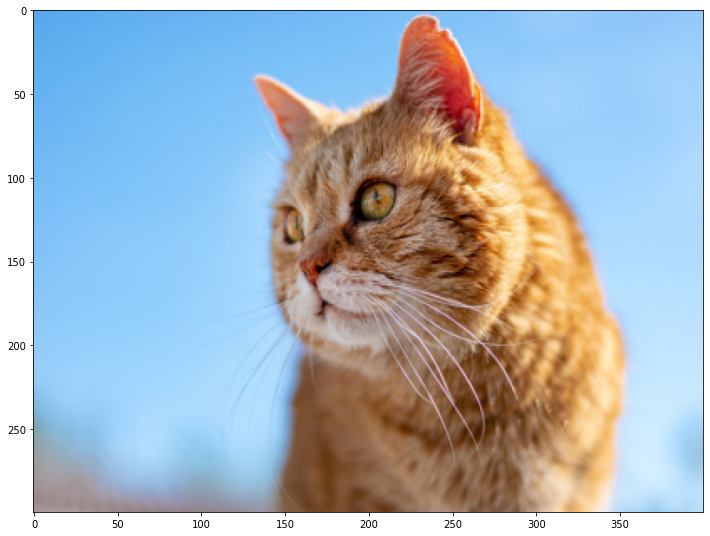

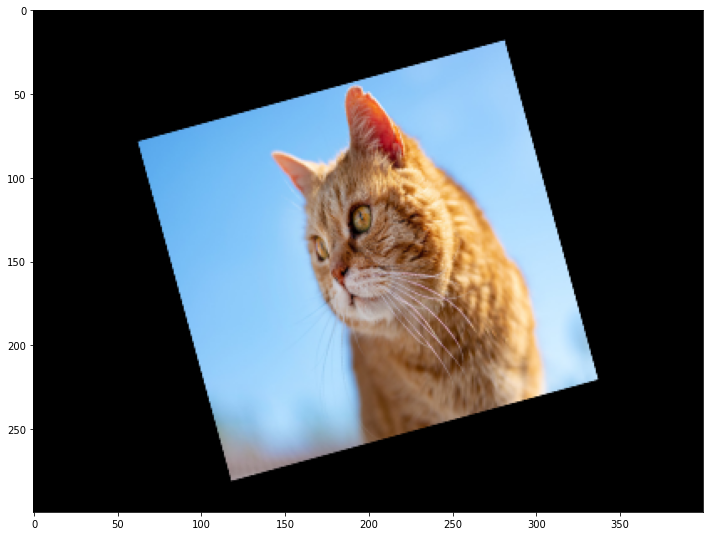

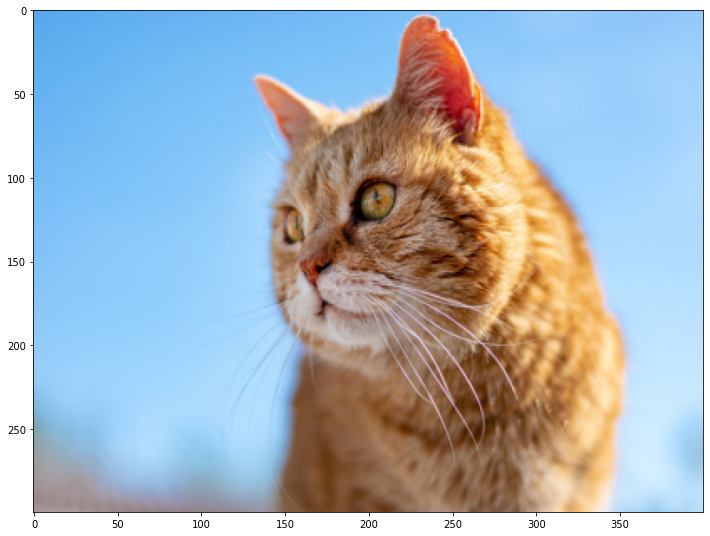

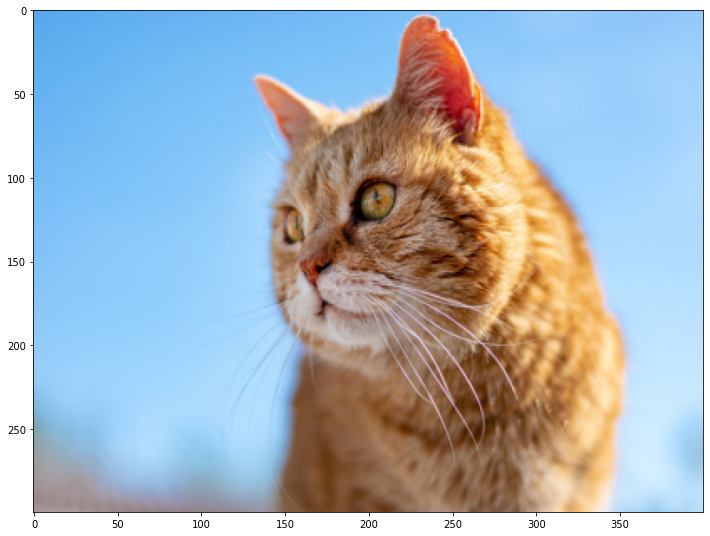

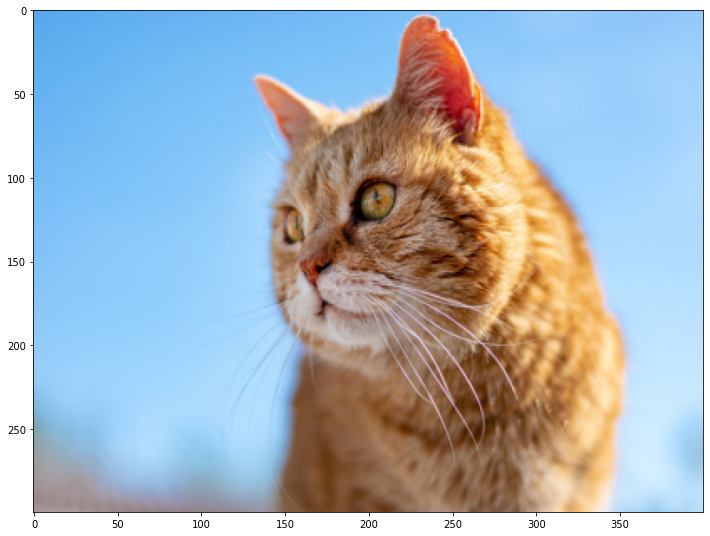

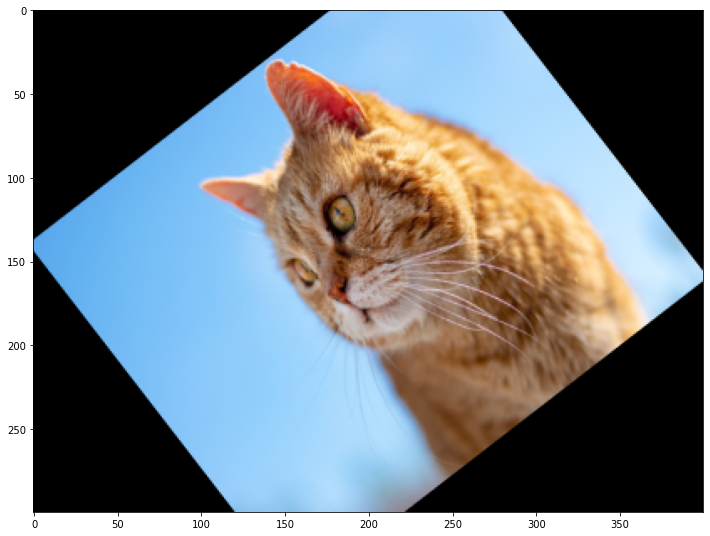

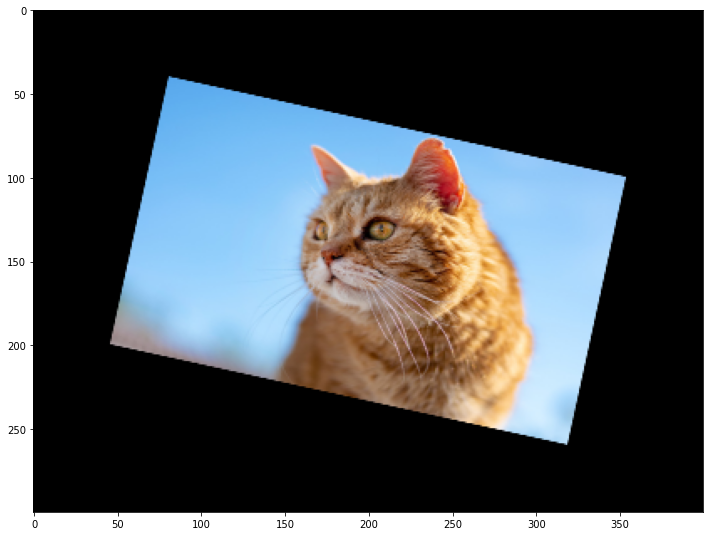

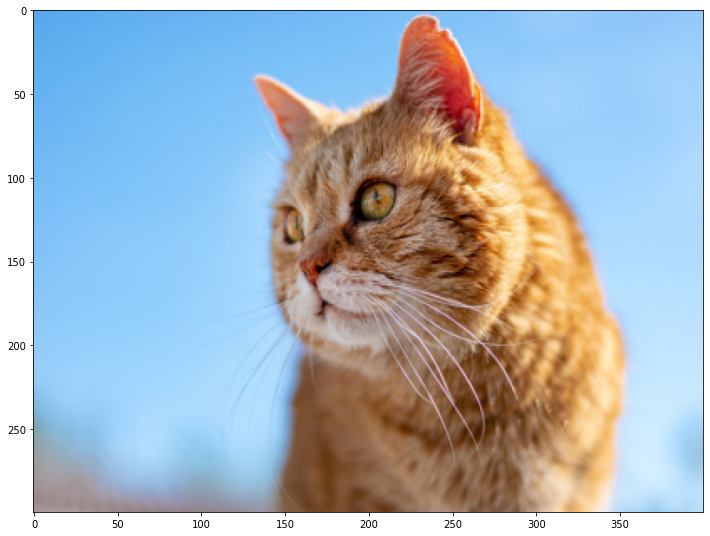

In [18]:
# -45도와 45도 사이에 랜덤하게 각도를 변환하는 augmention을 10장 

import albumentations as A

for i in range(10):
    transform = A.Compose([
        A.Affine(rotate=(-45, 45),scale=(0.5,0.9),p=0.5) 
    ])
    transformed = transform(image=image_arr)
    plt.figure(figsize=(12,12))
    plt.imshow((transformed['image']))
    plt.show()

2. ransforms.RandomCrop()

이번에는 RandomCrop()을 사용해서 256x256 정도의 부분을 랜덤하게 짤 10개 정도 생성
https://albumentations.ai/docs/api_reference/augmentations/crops/transforms/#albumentations.augmentations.crops.transforms.RandomCrop

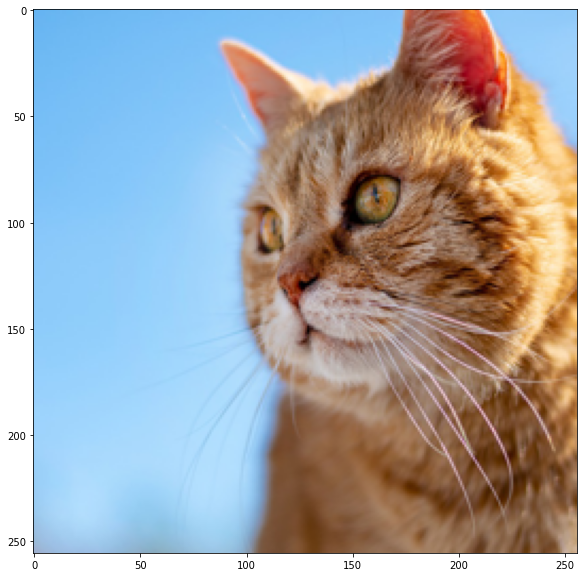

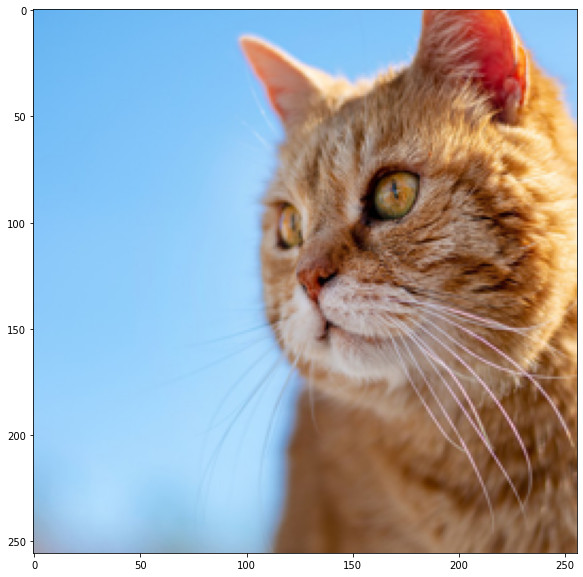

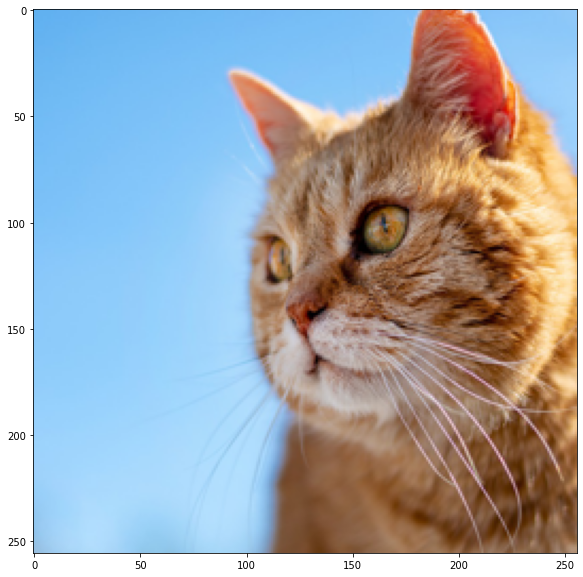

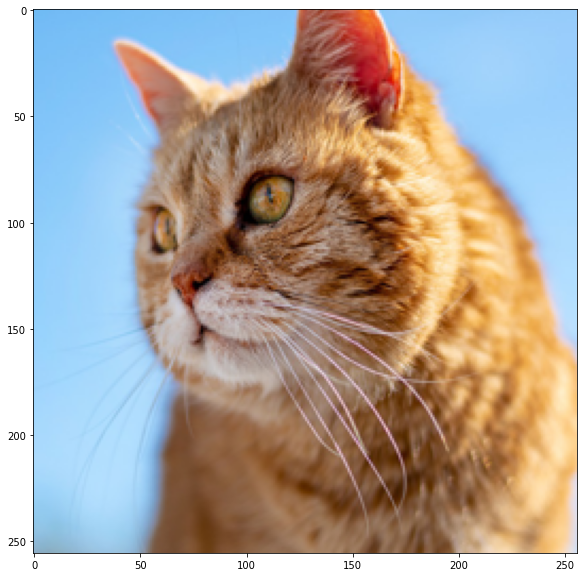

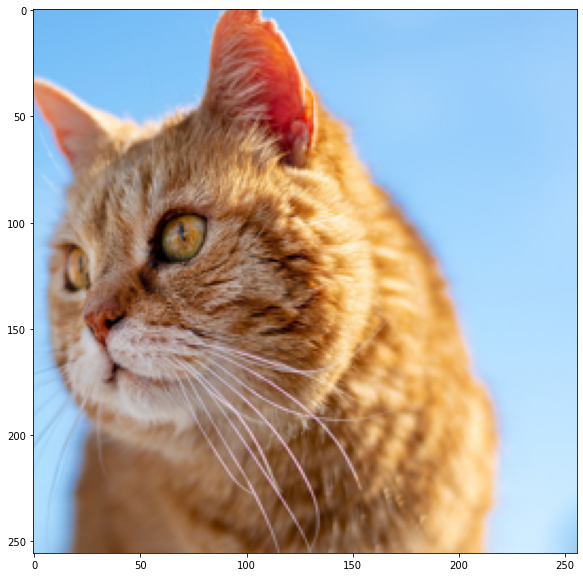

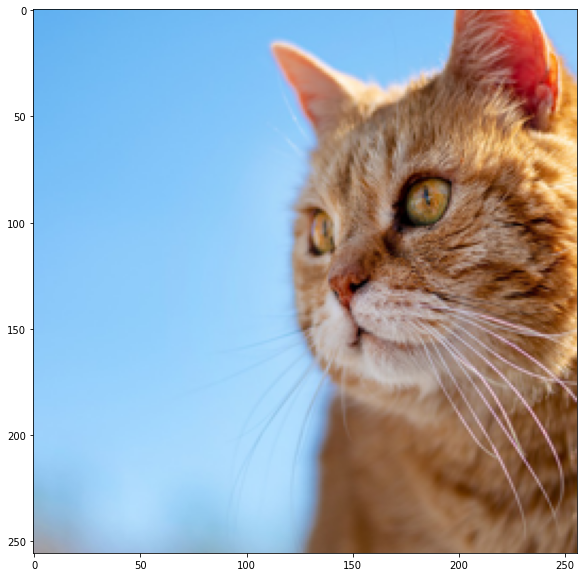

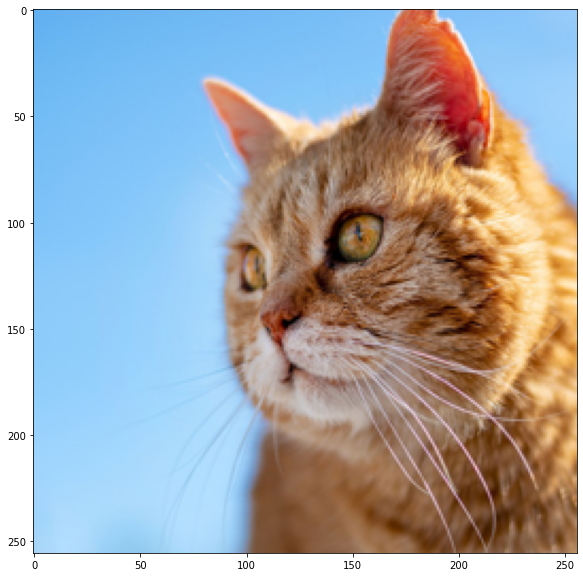

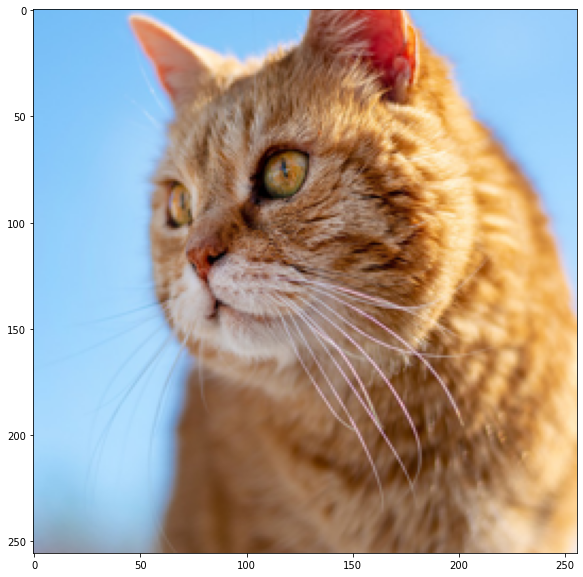

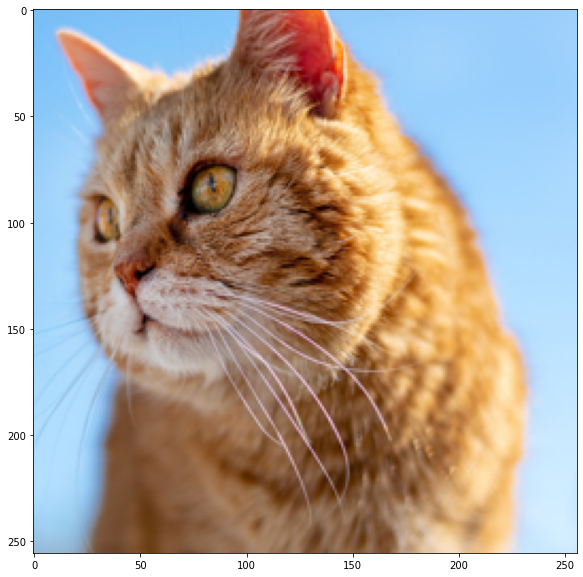

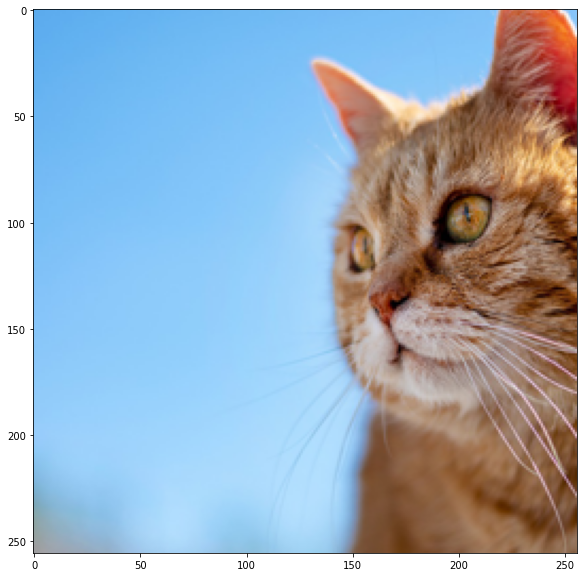

In [19]:
import random
for i in range(10):
    transform = A.Compose(
        [A.RandomCrop(width=256, height=256)]
    )
    transformed = transform(image=image_arr)
    visualize(transformed['image'])

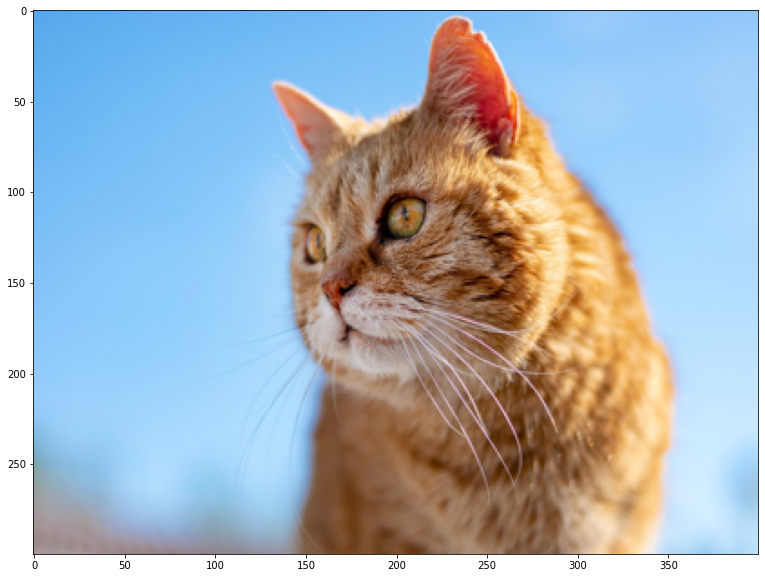

In [20]:
# MedianBlur()

transform = A.Compose(
    [
    A.MedianBlur (blur_limit=7, always_apply=False, p=0.5)]
    
)
transformed = transform(image=image_arr)
visualize(transformed['image'])

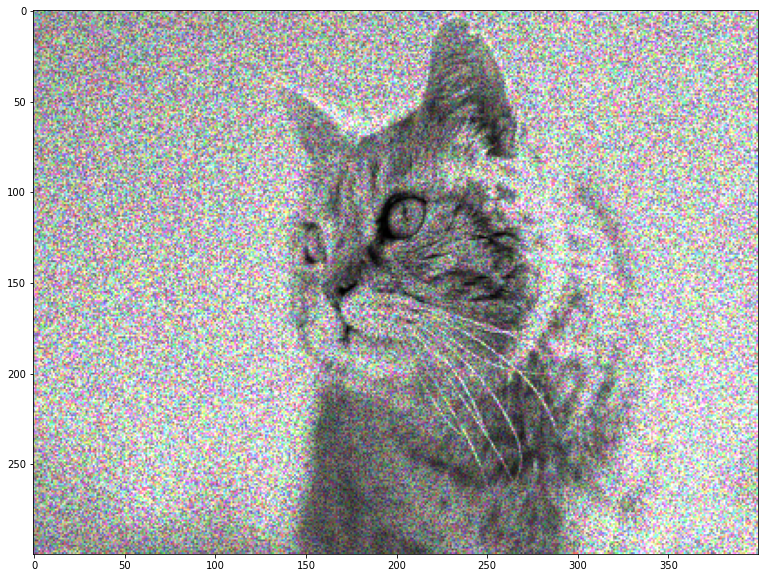

In [21]:
# ToGray(),MultiplicativeNoise()

transform = A.Compose(
    [A.ToGray(p=1),
    A.MultiplicativeNoise(multiplier=[0.5, 1.5], elementwise=True, per_channel=True, p=1)]
    
)
transformed = transform(image=image_arr)
visualize(transformed['image'])

지금 까지 사용해본 내용을 토대로 그래이 색상의 노이즈가 있는 RandomCrop()을 사용하여 고양이 이미지 100장을 시각화 해보기

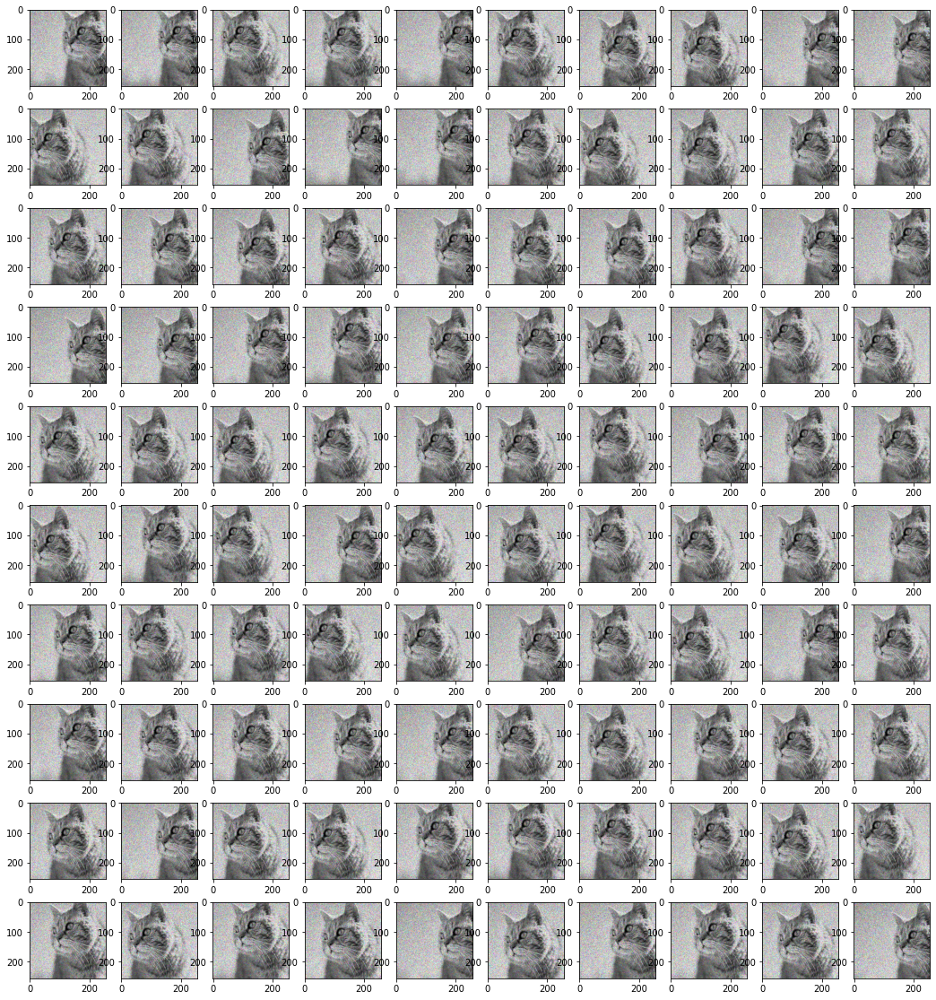

In [22]:
# Use various techniques and functions in albumentations library. show 100 images.

def transform_data(img_arr):
    transform = A.Compose(
    [A.ToGray(p=1),
    A.MultiplicativeNoise(multiplier=[0.5, 1.5], 
                          elementwise=True, per_channel=True, p=1),
     A.RandomCrop(width=256, height=256)
    ]
    )
    t_image = transform(image=img_arr)
    t_image = t_image['image']
    return t_image

plt.figure(figsize=(18,20))
for i in range(100):
    image = transform_data(image_arr)
    plt.subplot(10,10,i+1)
    plt.imshow(image)